## Libraries importing

In [1]:
# Importing basic libraries
import pandas as pd
import numpy as np
import matplotlib as plt

# Importing dataset
from keras.datasets import mnist
import urllib.request

# Importing visualization tools
from matplotlib import pyplot

# Importing data analysis tools
from ydata_profiling import ProfileReport
import sweetviz as sv
import great_expectations as ge

# Importing data manipulation tools
from sklearn.model_selection import train_test_split

2023-07-14 21:22:09.759874: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-07-14 21:22:13.407418: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-07-14 21:22:13.407466: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2023-07-14 21:22:13.844415: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-07-14 21:22:17.934669: W tensorflow/stream_executor/platform/de

## Constants

In [2]:
URL = "https://raw.githubusercontent.com/datasciencedojo/datasets/master/titanic.csv"

FILE_PATH = "titanic.csv"

## Loading data

In [3]:
urllib.request.urlretrieve(URL, FILE_PATH)

df = pd.read_csv(FILE_PATH)

## Dataset visualization

In [4]:
df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


## Making training and testing datasets

In [5]:
x = df.drop("Survived", axis=1)
y = df["Survived"]

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, shuffle=True, random_state=42)

df_train = pd.concat([x_train, y_train], axis=1)
df_test = pd.concat([x_test, y_test], axis=1)

df_train.to_csv("titanic_train.csv", index=False)
df_test.to_csv("titanic_test.csv", index=False)

## Dataset analysis with ydata-profiling (ex. pandas-profiling)

### Analysis of the all data 

In [6]:
ydata_report = ProfileReport(df, title="Titanic Dataset Report")
ydata_report.to_notebook_iframe()
ydata_report.to_file("Titanic ydata-profiling report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### Comparing train and test datasets

In [7]:
ydata_report_train = ProfileReport(df_train, title="Train Dataset")
ydata_report_test = ProfileReport(df_test, title="Test Dataset")

ydata_comparison_report = ydata_report_train.compare(ydata_report_test)
ydata_comparison_report.to_notebook_iframe()
ydata_comparison_report.to_file("Titanic ydata-profiling dataset comparison.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## Dataset analysis with sweetviz

### Analysis of the all data 

                                             |          | [  0%]   00:00 -> (? left)


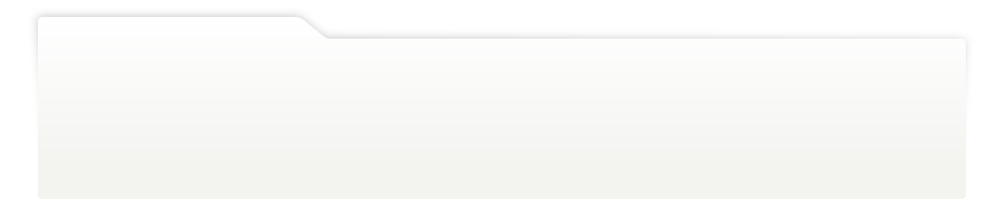
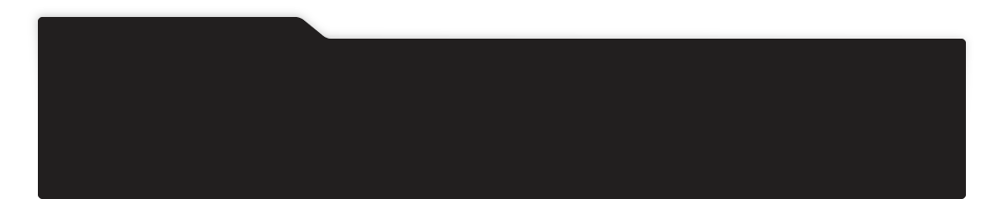
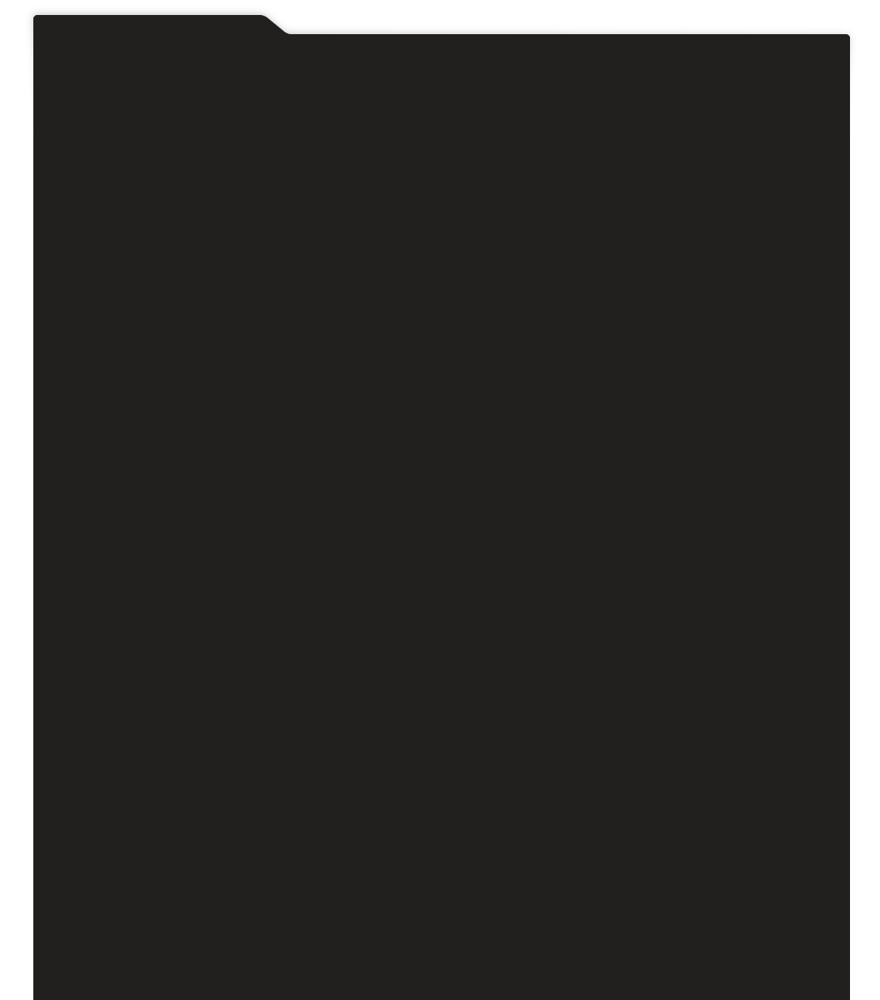
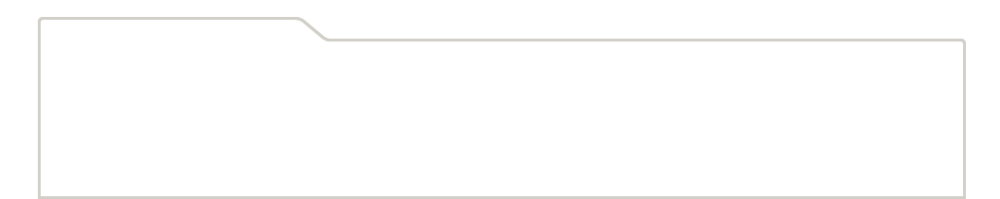
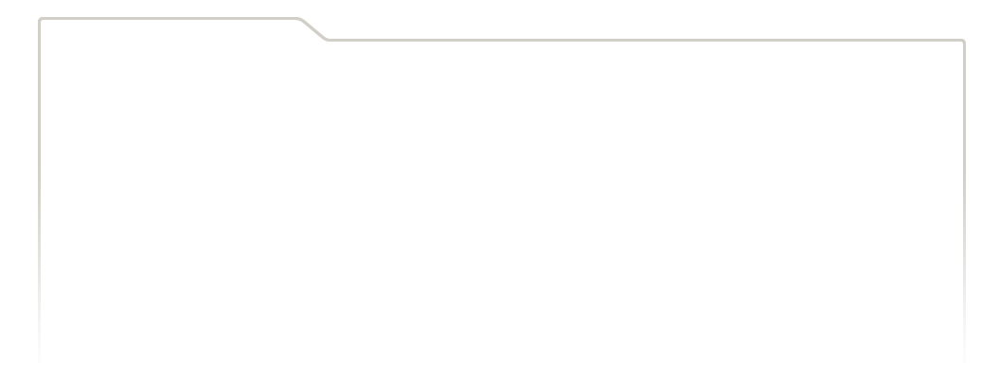
...
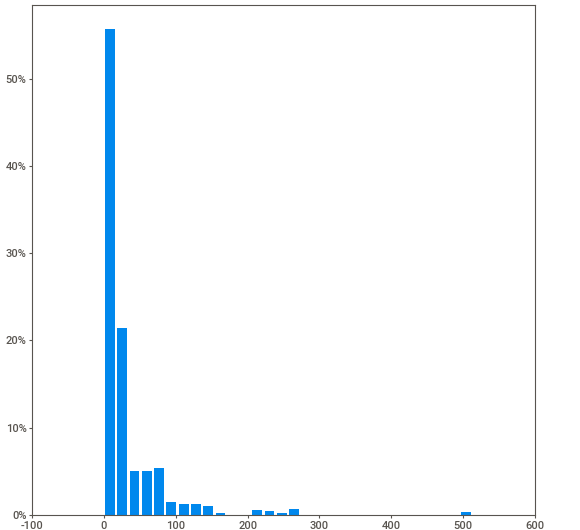
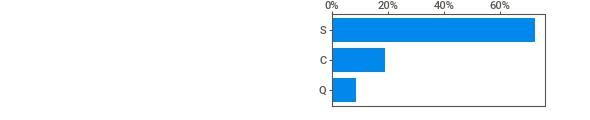
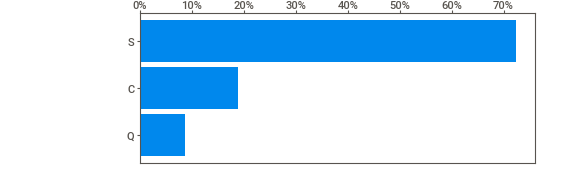
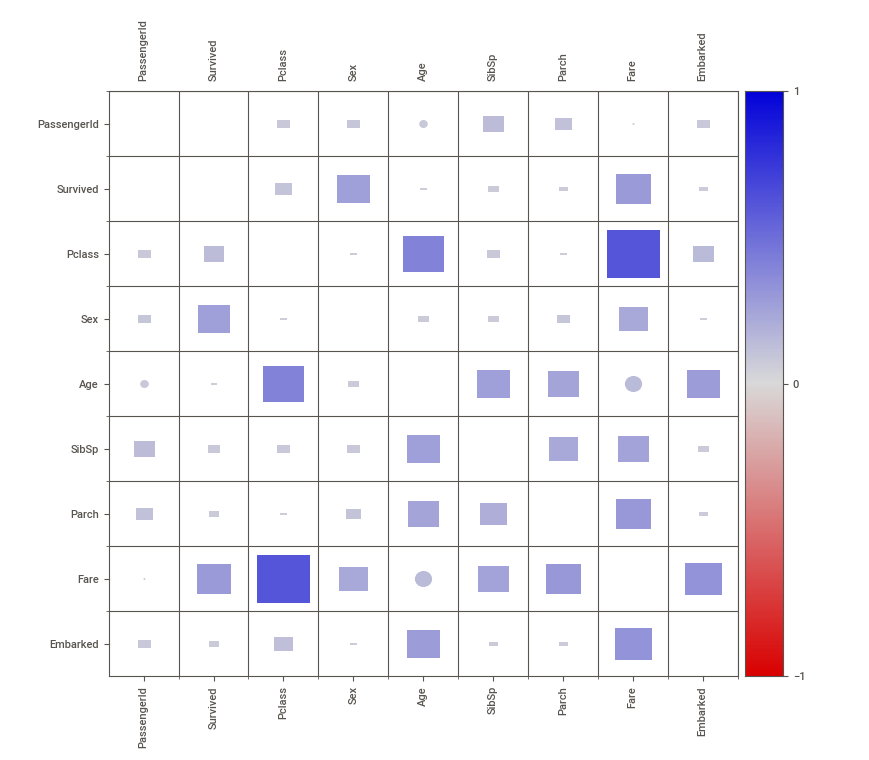
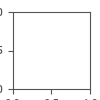

Report Titanic sweetviz report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [8]:
sweetviz_report = sv.analyze(df)
sweetviz_report.show_notebook()
sweetviz_report.show_html("Titanic sweetviz report.html")

### Comparing train and test datasets

                                             |          | [  0%]   00:00 -> (? left)


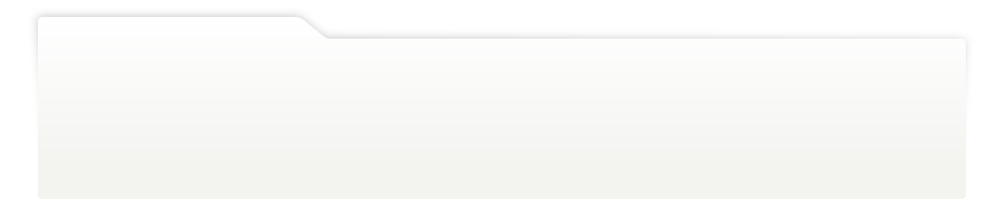
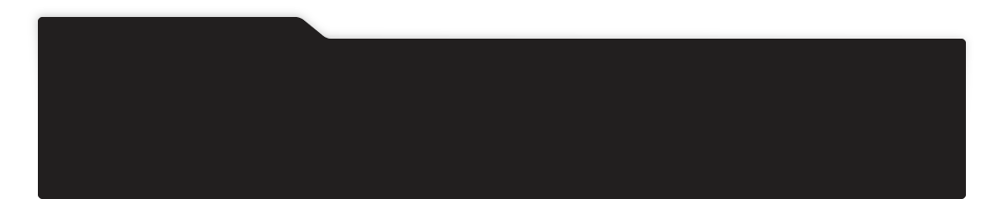
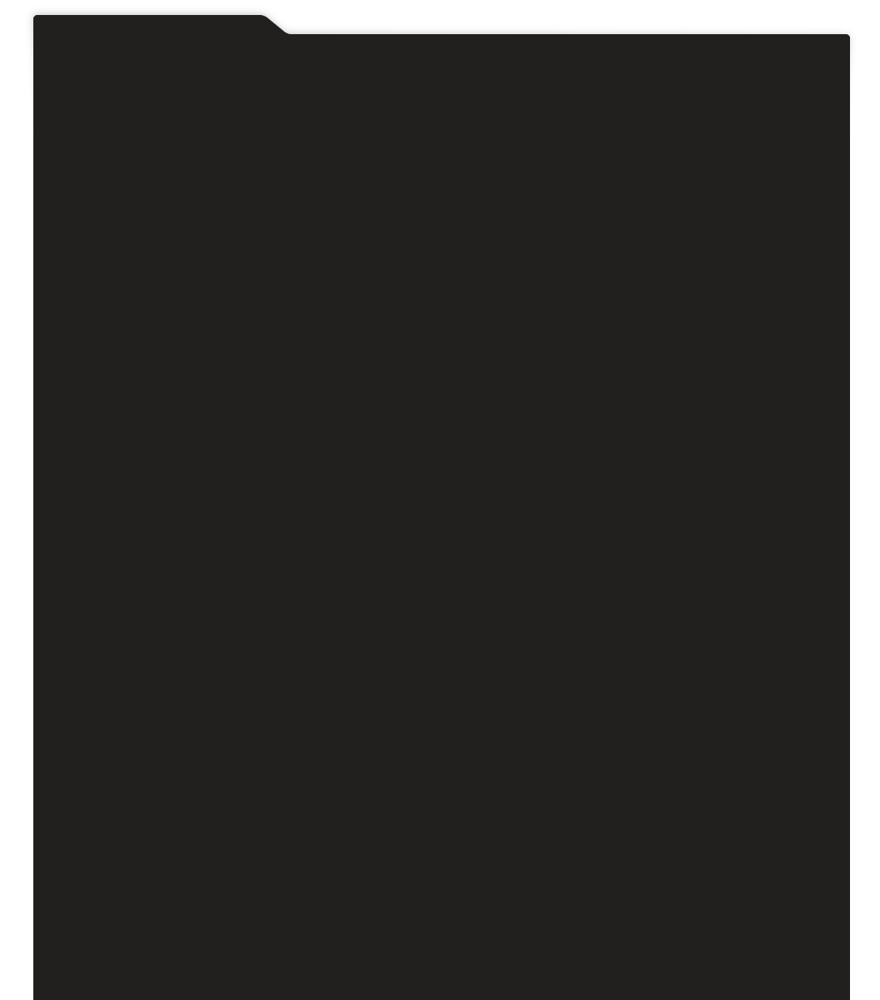
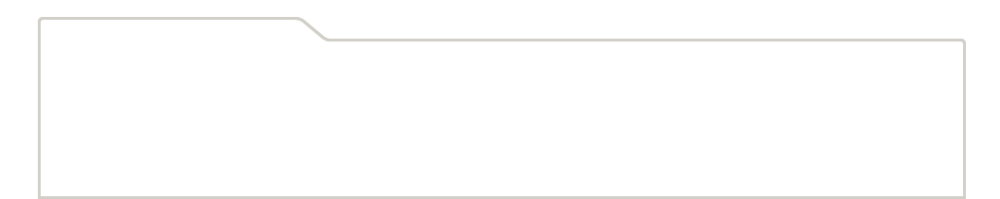
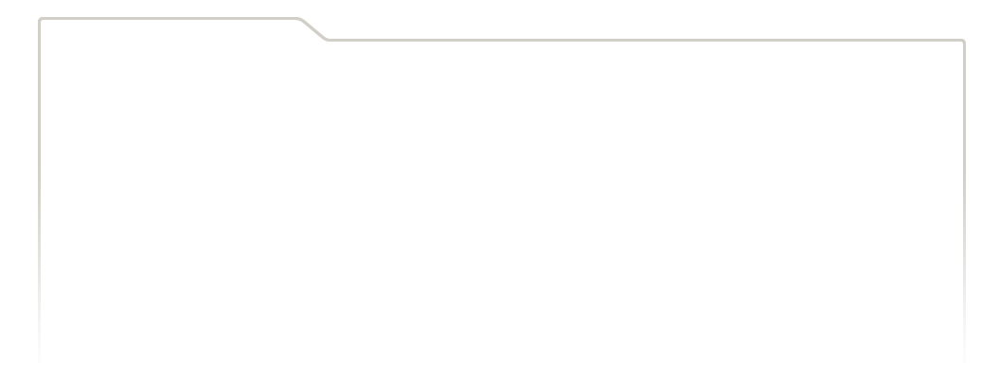
...
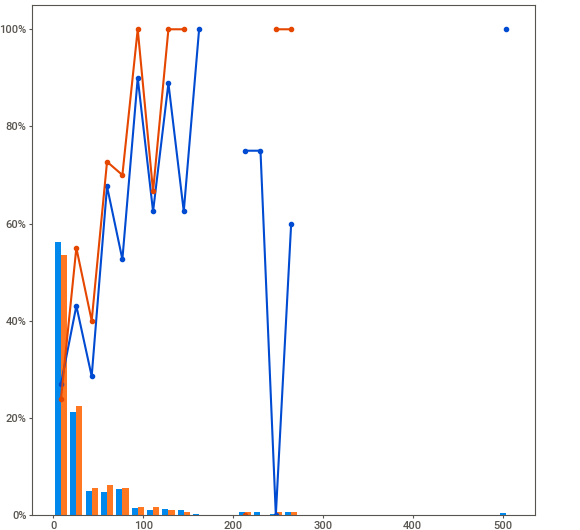
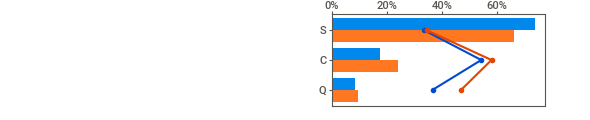
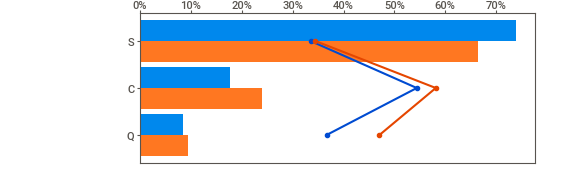
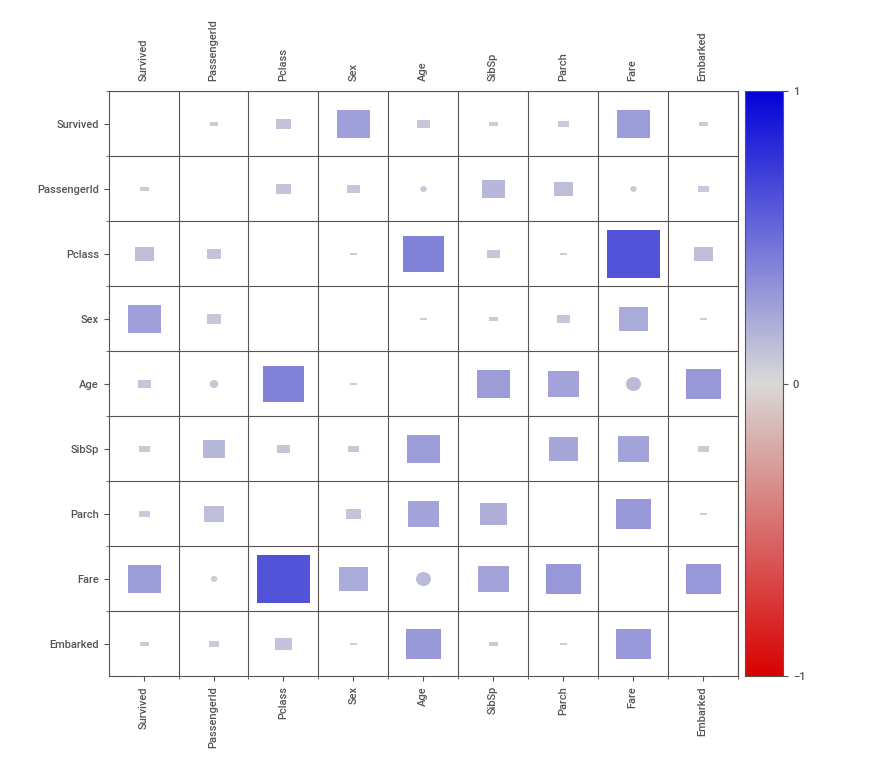
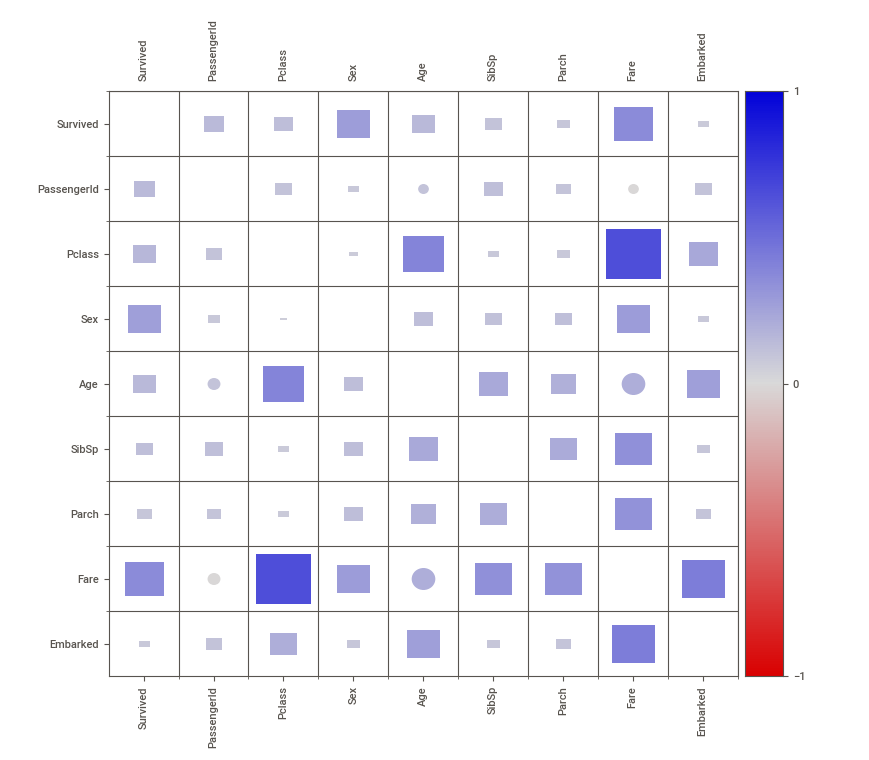

Report Titanic sweetviz dataset comparison.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [9]:
sweetviz_comparison_report = sv.compare([df_train,"Train dataset"], [df_test,"Test dataset"], target_feat="Survived")
sweetviz_comparison_report.show_notebook()
sweetviz_comparison_report.show_html("Titanic sweetviz dataset comparison.html")

## Dataset analysis with Great Expectations

Conversation of train and test datasets from pandas dataframes to great expectations dataframes:

In [10]:
df_ge_train = ge.read_csv("titanic_train.csv")
df_ge_test = ge.read_csv("titanic_test.csv")

# df_ge_train = ge.from_pandas(df_train)
# df_ge_test = ge.from_pandas(df_test)

### Train dataset analysis using Great Expectations

Checking if train dataset has "Survived" column:

In [11]:
df_ge_train.expect_column_to_exist("Survived")

{
  "meta": {},
  "success": true,
  "exception_info": {
    "raised_exception": false,
    "exception_traceback": null,
    "exception_message": null
  },
  "result": {}
}

Checking if column "Sex" have just "male" or "female" values:

In [12]:
df_ge_train.expect_column_values_to_be_in_set("Sex", ["male", "female"])

{
  "meta": {},
  "success": true,
  "exception_info": {
    "raised_exception": false,
    "exception_traceback": null,
    "exception_message": null
  },
  "result": {
    "element_count": 712,
    "missing_count": 0,
    "missing_percent": 0.0,
    "unexpected_count": 0,
    "unexpected_percent": 0.0,
    "unexpected_percent_total": 0.0,
    "unexpected_percent_nonmissing": 0.0,
    "partial_unexpected_list": []
  }
}

Checking if all values in column "Name" are unique:

In [13]:
df_ge_train.expect_column_values_to_be_unique("Name")

{
  "meta": {},
  "success": true,
  "exception_info": {
    "raised_exception": false,
    "exception_traceback": null,
    "exception_message": null
  },
  "result": {
    "element_count": 712,
    "missing_count": 0,
    "missing_percent": 0.0,
    "unexpected_count": 0,
    "unexpected_percent": 0.0,
    "unexpected_percent_total": 0.0,
    "unexpected_percent_nonmissing": 0.0,
    "partial_unexpected_list": []
  }
}

Checking if all values in column "Cabin" are nonexistent:

In [14]:
df_ge_train.expect_column_values_to_be_null("Cabin")

{
  "meta": {},
  "success": false,
  "exception_info": {
    "raised_exception": false,
    "exception_traceback": null,
    "exception_message": null
  },
  "result": {
    "element_count": 712,
    "unexpected_count": 159,
    "unexpected_percent": 22.331460674157302,
    "unexpected_percent_total": 22.331460674157302,
    "partial_unexpected_list": []
  }
}

Checking if all values in column "Cabin" are nonexistent with tolerance of 25 %:

In [15]:
df_ge_train.expect_column_values_to_be_null("Cabin", mostly=0.75)

{
  "meta": {},
  "success": true,
  "exception_info": {
    "raised_exception": false,
    "exception_traceback": null,
    "exception_message": null
  },
  "result": {
    "element_count": 712,
    "unexpected_count": 159,
    "unexpected_percent": 22.331460674157302,
    "unexpected_percent_total": 22.331460674157302,
    "partial_unexpected_list": []
  }
}

Validation of training dataset:

In [16]:
print("Expectation results for df_ge_train:")
df_ge_train.validate(result_format="BASIC")

Expectation results for df_ge_train:


{
  "meta": {
    "great_expectations_version": "0.17.5",
    "expectation_suite_name": "default",
    "run_id": {
      "run_name": null,
      "run_time": "2023-07-14T21:23:40.999870+02:00"
    },
    "batch_kwargs": {
      "ge_batch_id": "eff10b12-227b-11ee-a489-c1174b626da6"
    },
    "batch_markers": {},
    "batch_parameters": {},
    "validation_time": "20230714T192340.994200Z",
    "expectation_suite_meta": {
      "great_expectations_version": "0.17.5"
    }
  },
  "success": true,
  "results": [
    {
      "expectation_config": {
        "meta": {},
        "expectation_type": "expect_column_to_exist",
        "kwargs": {
          "column": "Survived",
          "result_format": "BASIC"
        }
      },
      "meta": {},
      "success": true,
      "exception_info": {
        "raised_exception": false,
        "exception_message": null,
        "exception_traceback": null
      },
      "result": {}
    },
    {
      "expectation_config": {
        "meta": {},
       

### Test dataset analysis using Great Expectations

Saving expectations suite of train dataset:

In [17]:
expectations_suite = df_ge_train.get_expectation_suite()

Validation of test dataset with training dataset expectations suit: 

In [18]:
print("Expectation results for df_ge_test:")
df_ge_test.validate(expectations_suite, result_format="BASIC")

Expectation results for df_ge_test:


{
  "meta": {
    "great_expectations_version": "0.17.5",
    "expectation_suite_name": "default",
    "run_id": {
      "run_name": null,
      "run_time": "2023-07-14T21:23:41.406031+02:00"
    },
    "batch_kwargs": {
      "ge_batch_id": "eff850f2-227b-11ee-a489-c1174b626da6"
    },
    "batch_markers": {},
    "batch_parameters": {},
    "validation_time": "20230714T192341.405920Z",
    "expectation_suite_meta": {
      "great_expectations_version": "0.17.5"
    }
  },
  "success": false,
  "results": [
    {
      "expectation_config": {
        "meta": {},
        "expectation_type": "expect_column_to_exist",
        "kwargs": {
          "column": "Survived",
          "result_format": "BASIC"
        }
      },
      "meta": {},
      "success": true,
      "exception_info": {
        "raised_exception": false,
        "exception_message": null,
        "exception_traceback": null
      },
      "result": {}
    },
    {
      "expectation_config": {
        "meta": {},
      